# NTU CSIE - Digital Visual Effects (2022 Spring)

## Project 2 - Image Stitching

### Environment Setup

In [1]:
import argparse
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
from time import time

In [2]:
args = {
    'input_directory'  : '../data/input/scene_1' , 
    'scale'            : 0.2 ,  
    'focal_length'     : 7893 , 
    'global_alignment' : 1 , 
    'output_image'     : '../result.png'
}

args = argparse.Namespace(**args)

### Load Images

In [3]:
images = []
for file_name in os.listdir(args.input_directory):
    if file_name.endswith('jpg') or file_name.endswith('JPG') or file_name.endswith('png') or file_name.endswith('PNG'):
        image = cv2.imread(os.path.join(args.input_directory , file_name) , cv2.IMREAD_COLOR)
        image = cv2.resize(image , (int(args.scale * image.shape[1]) , int(args.scale * image.shape[0])) , cv2.INTER_LINEAR)
        images.append(image)

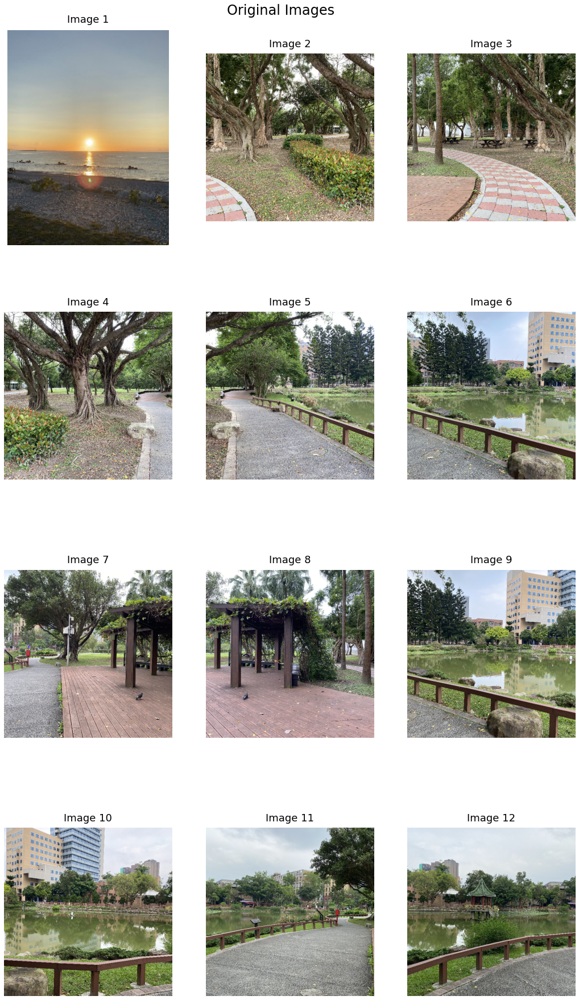

In [4]:
fig , axes = plt.subplots(int(np.ceil(len(images) / 3)) , 3 , figsize = (18 , 32))
for i , image in enumerate(images):
    ax = axes[i // 3 , i % 3]
    ax.set_title(f'Image {i + 1}' , fontsize = 18 , y = 1.02)
    ax.imshow(cv2.cvtColor(image , cv2.COLOR_BGR2RGB))
    ax.set_axis_off()
plt.suptitle('Original Images' , fontsize = 24 , y = 0.9)
plt.show()

### Cylindrical Projection

In [5]:
def cylindrical_projection(image , focal_length):
    height , width , channel = image.shape
    new_height , new_width = height , int(2 * (focal_length * np.arctan2(width / 2 , focal_length)))
    new_image = np.zeros((new_height , new_width , channel))
    mask = np.zeros((new_height , new_width , channel))
    for new_i in range(new_height):
        for new_j in range(new_width):
            for k in range(channel):
                j = focal_length * np.tan((new_j - new_width / 2) / focal_length) + width / 2
                i = height / 2 - (new_height / 2 - new_i) / focal_length * np.sqrt((j - width / 2)**2 + focal_length**2)
                if i >= 0 and i <= height - 1 and j >= 0 and j <= width - 1:
                    a00 = int(image[int(np.floor(i))][int(np.floor(j))][k])
                    a01 = int(image[int(np.floor(i))][int(np.ceil(j))][k])
                    a10 = int(image[int(np.ceil(i))][int(np.floor(j))][k])
                    a11 = int(image[int(np.ceil(i))][int(np.ceil(j))][k])
                    r0 = j - int(j)
                    r1 = i - int(i)
                    b0 = a00 + r0 * (a01 - a00)
                    b1 = a10 + r0 * (a11 - a10)
                    new_image[new_i][new_j][k] = b0 + r1 * (b1 - b0)
                    mask[new_i][new_j] = 1
    return new_image.astype(np.uint8) , mask

In [6]:
if args.focal_length:
    new_images , masks = [] , []
    for i in range(len(images)):
        print(f'Process image {i + 1} ' , end = '')
        start = time()
        new_image , mask = cylindrical_projection(images[i] , int(args.scale * args.focal_length))
        end = time()
        print(f'({int(end - start)}s)')
        new_images.append(new_image)
        masks.append(mask)
    images = new_images
else:
    print('Skip cylindrical projection.')
    masks = [np.ones(image.shape) for image in images]

Process image 1 (0s)
Process image 2 (9s)
Process image 3 (9s)
Process image 4 (9s)
Process image 5 (9s)
Process image 6 (9s)
Process image 7 (9s)
Process image 8 (9s)
Process image 9 (9s)
Process image 10 (9s)
Process image 11 (9s)
Process image 12 (9s)


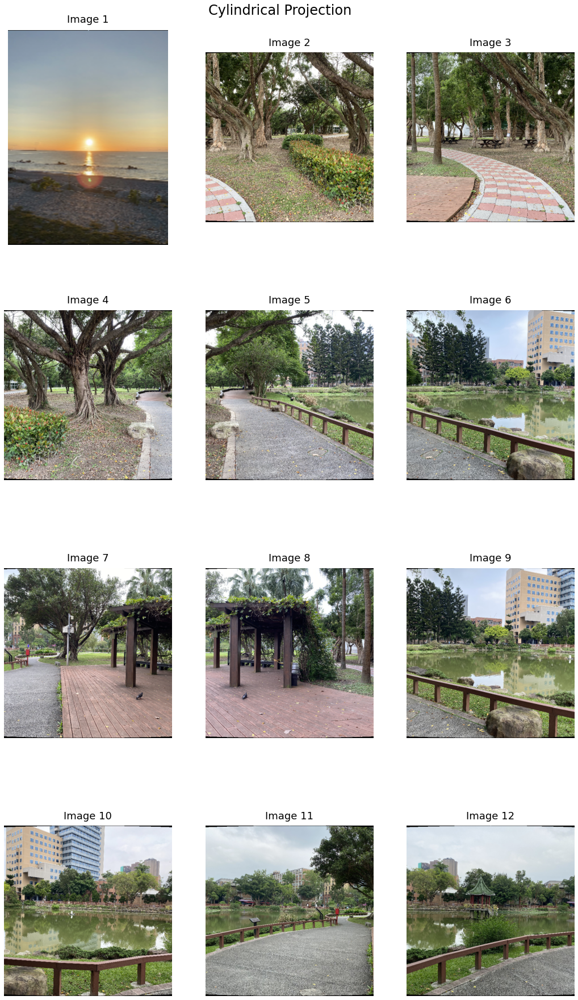

In [7]:
if args.focal_length:
    fig , axes = plt.subplots(int(np.ceil(len(images) / 3)) , 3 , figsize = (18 , 32))
    for i , image in enumerate(images):
        ax = axes[i // 3 , i % 3]
        ax.set_title(f'Image {i + 1}' , fontsize = 18 , y = 1.02)
        ax.imshow(cv2.cvtColor(image , cv2.COLOR_BGR2RGB))
        ax.set_axis_off()
    plt.suptitle('Cylindrical Projection' , fontsize = 24 , y = 0.9)
    plt.show()

### Feature Detection

Reference: https://medium.com/@russmislam/implementing-sift-in-python-a-complete-guide-part-1-306a99b50aa5

In [8]:
class Keypoint:
    def __init__(self , x , y , orientation , octave , size , response):
        self.x = x
        self.y = y
        self.orientation = orientation
        self.octave = octave
        self.size = size
        self.response = response
    
    def __eq__(self , another):
        return self.x == another.x and self.y == another.y and self.orientation == another.orientation and self.octave == another.octave and self.size == another.size and self.response == another.response
    
    def __lt__(self , another):
        return (self.x < another.x) or \
               (self.x == another.x and self.y < another.y) or \
               (self.x == another.x and self.y == another.y and self.orientation < another.orientation) or \
               (self.x == another.x and self.y == another.y and self.orientation == another.orientation and self.octave < another.octave) or \
               (self.x == another.x and self.y == another.y and self.orientation == another.orientation and self.octave == another.octave and self.size < another.size) or \
               (self.x == another.x and self.y == another.y and self.orientation == another.orientation and self.octave == another.octave and self.size == another.size and self.response < another.response)

class SIFT:
    def __init__(self , sigma = 1.6 , number_of_interval = 3 , contrast_threshold = 0.04 , eigenvalue_ratio = 10):
        self.sigma = sigma
        self.number_of_interval = number_of_interval
        self.contrast_threshold = contrast_threshold
        self.edge_threshold = (eigenvalue_ratio + 1)**2 / eigenvalue_ratio
        self.threshold = int(127.5 * contrast_threshold / number_of_interval)

    def generate_base_image(self , image):
        image = cv2.cvtColor(image , cv2.COLOR_BGR2GRAY).astype(np.float32)
        image = cv2.resize(image , (0 , 0) , fx = 2 , fy = 2 , interpolation = cv2.INTER_LINEAR)
        kernel_size = np.sqrt(self.sigma**2 - 1)
        image = cv2.GaussianBlur(image , (0 , 0) , sigmaX = kernel_size , sigmaY = kernel_size)
        self.base_image = image

    def construct_pyramid(self):
        number_of_octave = int(np.round(np.log2(min(self.base_image.shape)) - 1))
        Gaussian_pyramid , DoG_pyramid = [] , []
        previous_image = self.base_image
        for i in range(number_of_octave):
            Gaussian_images , DoG_images = [previous_image] , []
            for j in range(self.number_of_interval + 2):
                kernel_size = np.sqrt((self.sigma * 2**((j + 1) / self.number_of_interval))**2 - (self.sigma * 2**(j / self.number_of_interval))**2)
                image = cv2.GaussianBlur(previous_image , (0 , 0) , sigmaX = kernel_size , sigmaY = kernel_size)
                Gaussian_images.append(image)
                DoG_images.append(image - previous_image)
                previous_image = image
            Gaussian_pyramid.append(np.array(Gaussian_images))
            DoG_pyramid.append(np.array(DoG_images))
            previous_image = Gaussian_images[-3]
            previous_image = cv2.resize(previous_image , (previous_image.shape[1] // 2 , previous_image.shape[0] // 2) , interpolation = cv2.INTER_NEAREST)
        self.number_of_octave = number_of_octave
        self.Gaussian_pyramid = Gaussian_pyramid
        self.DoG_pyramid = DoG_pyramid

    def keypoint_localization(self , border = 5):
        keypoints = []
        for octave_index in range(self.number_of_octave):
            DoG_images = self.DoG_pyramid[octave_index]
            for image_index in range(1 , self.number_of_interval + 1):
                DoG_image = DoG_images[image_index]
                height , width = DoG_image.shape
                for y in range(border , height - border):
                    for x in range(border , width - border):
                        if abs(DoG_image[y][x]) > self.threshold and \
                           ((DoG_image[y][x] >= 0 and np.all(DoG_image[y][x] >= DoG_images[image_index - 1 : image_index + 2 , y - 1 : y + 2 , x - 1 : x + 2])) or \
                            (DoG_image[y][x] < 0 and np.all(DoG_image[y][x] <= DoG_images[image_index - 1 : image_index + 2 , y - 1 : y + 2 , x - 1 : x + 2]))):
                            ret = self.accurate_keypoint_localization(DoG_images , octave_index , image_index , x , y , border)
                            if ret is not None:
                                keypoint , accurate_image_index = ret
                                keypoints += self.find_orientation(keypoint , self.Gaussian_pyramid[octave_index][accurate_image_index] , octave_index)

        keypoints.sort()
        unique_keypoints = [keypoints[0]]
        for i in range(1 , len(keypoints)):
            if keypoints[i] != unique_keypoints[-1]:
                unique_keypoints.append(keypoints[i])

        for i in range(len(unique_keypoints)):
            unique_keypoints[i].x /= 2
            unique_keypoints[i].y /= 2
            unique_keypoints[i].size /= 2
            unique_keypoints[i].octave = (unique_keypoints[i].octave & ~255) | ((unique_keypoints[i].octave - 1) & 255)

        return unique_keypoints

    def accurate_keypoint_localization(self , DoG_images , octave_index , image_index , x , y , border = 5 , iteration = 5):
        for _ in range(iteration):
            gradient = self.compute_gradient(DoG_images / 255 , image_index , x , y)
            Hessian = self.compute_Hessian(DoG_images / 255 , image_index , x , y)
            offset = -np.linalg.lstsq(Hessian , gradient , rcond = None)[0]
            if np.all(np.abs(offset) < 0.5):
                break
            image_index += int(np.round(offset[0]))
            x += int(np.round(offset[2]))
            y += int(np.round(offset[1]))
            if (image_index < 1 or image_index > self.number_of_interval) or (x < border or x >= DoG_images.shape[2] - border) or (y < border or y >= DoG_images.shape[1] - border):
                return None
        else:
            return None

        contrast_response = DoG_images[image_index][y][x] / 255 + 0.5 * np.dot(gradient , offset)
        edge_response = np.trace(Hessian[1 : , 1 : ])**2 / (np.linalg.det(Hessian[1 : , 1 : ]) + 1e-7)
        if abs(contrast_response) * self.number_of_interval >= self.contrast_threshold and (np.linalg.det(Hessian[1 : , 1 : ]) > 0 and edge_response < self.edge_threshold):
            keypoint = Keypoint(
                (x + offset[2]) * 2**octave_index , 
                (y + offset[1]) * 2**octave_index , 
                None , 
                octave_index + 256 * image_index + 65536 * int(np.round(255 * (offset[0] + 0.5))) , 
                self.sigma * 2**((image_index + offset[0]) / self.number_of_interval) * 2**(octave_index + 1) , 
                abs(contrast_response)
            )
            return keypoint , image_index
        else:
            return None

    def compute_gradient(self , DoG_images , image_index , x , y):
        dx = (DoG_images[image_index + 1][y][x] - DoG_images[image_index - 1][y][x]) / 2
        dy = (DoG_images[image_index][y + 1][x] - DoG_images[image_index][y - 1][x]) / 2
        dz = (DoG_images[image_index][y][x + 1] - DoG_images[image_index][y][x - 1]) / 2
        return np.array([dx , dy , dz])
    
    def compute_Hessian(self , DoG_images , image_index , x , y):
        dxx = DoG_images[image_index + 1][y][x] + DoG_images[image_index - 1][y][x] - 2 * DoG_images[image_index][y][x]
        dyy = DoG_images[image_index][y + 1][x] + DoG_images[image_index][y - 1][x] - 2 * DoG_images[image_index][y][x]
        dzz = DoG_images[image_index][y][x + 1] + DoG_images[image_index][y][x - 1] - 2 * DoG_images[image_index][y][x]
        dxy = ((DoG_images[image_index + 1][y + 1][x] - DoG_images[image_index - 1][y + 1][x]) - (DoG_images[image_index + 1][y - 1][x] - DoG_images[image_index - 1][y - 1][x])) / 4
        dyz = ((DoG_images[image_index][y + 1][x + 1] - DoG_images[image_index][y - 1][x + 1]) - (DoG_images[image_index][y + 1][x - 1] - DoG_images[image_index][y - 1][x - 1])) / 4
        dzx = ((DoG_images[image_index + 1][y][x + 1] - DoG_images[image_index + 1][y][x - 1]) - (DoG_images[image_index - 1][y][x + 1] - DoG_images[image_index - 1][y][x - 1])) / 4
        return np.array([[dxx , dxy , dzx] , 
                         [dxy , dyy , dyz] , 
                         [dzx , dyz , dzz]])
    
    def find_orientation(self , keypoint , Gaussian_image , octave_index , number_of_bin = 36 , peak_ratio = 0.8):
        scale = 1.5 * (keypoint.size / 2**(octave_index + 1))
        radius = int(np.round(3 * scale))
        weight_factor = -0.5 / scale** 2
        histogram = np.zeros(number_of_bin)
        smooth_histogram = np.zeros(number_of_bin)
        height , width = Gaussian_image.shape
        x = int(np.round(keypoint.x / 2**octave_index))
        y = int(np.round(keypoint.y / 2**octave_index))
        for i in range(-radius , radius + 1):
            for j in range(-radius , radius + 1):
                if x + i <= 0 or x + i >= width - 1 or y + j <= 0 or y + j >= height - 1:
                    continue
                dx = Gaussian_image[y + j , x + i + 1] - Gaussian_image[y + j , x + i - 1]
                dy = Gaussian_image[y + j - 1 , x + i] - Gaussian_image[y + j + 1 , x + i]
                gradient_magnitude = np.sqrt(dx**2 + dy**2)
                gradient_degree = np.rad2deg(np.arctan2(dy , dx))
                weight = np.exp(weight_factor * (i**2 + j**2))
                histogram[int(np.round(gradient_degree / (360 / number_of_bin)))] += weight * gradient_magnitude
        
        for i in range(number_of_bin):
            smooth_histogram[i] = (histogram[i - 2] + 4 * histogram[i - 1] + 6 * histogram[i] + 4 * histogram[(i + 1) % number_of_bin] + histogram[(i + 2) % number_of_bin]) / 16

        keypoints = []
        for i in range(number_of_bin):
            if smooth_histogram[i] > smooth_histogram[i - 1] and smooth_histogram[i] > smooth_histogram[(i + 1) % number_of_bin] and smooth_histogram[i] >= peak_ratio * np.max(smooth_histogram):
                orientation = 360 - (360 / number_of_bin) * ((i + 0.5 * (smooth_histogram[i - 1] - smooth_histogram[(i + 1) % number_of_bin]) / (smooth_histogram[i - 1] - 2 * smooth_histogram[i] + smooth_histogram[(i + 1) % number_of_bin])) % number_of_bin)
                if abs(orientation - 360) < 1e-7:
                    orientation = 0
                oriented_keypoint = Keypoint(
                    keypoint.x , 
                    keypoint.y , 
                    orientation , 
                    keypoint.octave , 
                    keypoint.size , 
                    keypoint.response
                )
                keypoints.append(oriented_keypoint)
        return keypoints

    def keypoint_detection(self , image):
        self.generate_base_image(image)
        self.construct_pyramid()
        keypoints = self.keypoint_localization()
        return keypoints

    def keypoint_description(self , keypoints , window_size = 4 , number_of_bin = 8):
        descriptors = []
        for keypoint in keypoints:
            octave_index = keypoint.octave & 255
            image_index = (keypoint.octave >> 8) & 255
            if octave_index >= 128:
                octave_index = octave_index | -128
            scale = 1 / (1 << octave_index) if octave_index >= 0 else 1 << -octave_index

            Gaussian_image = self.Gaussian_pyramid[octave_index + 1][image_index]
            height , width = Gaussian_image.shape
            x = int(np.round(scale * keypoint.x))
            y = int(np.round(scale * keypoint.y))
            degree = 360 - keypoint.orientation

            histogram_width = 1.5 * scale * keypoint.size
            radius = int(np.round(np.sqrt(0.5) * histogram_width * (window_size + 1)))
            radius = int(min(radius , np.sqrt(height**2 + width**2)))
            bin_list , magnitude_list , degree_list = [] , [] , []
            for i in range(-radius , radius + 1):
                for j in range(-radius , radius + 1):
                    rotated_i = j * np.sin(np.deg2rad(degree)) + i * np.cos(np.deg2rad(degree))
                    rotated_j = j * np.cos(np.deg2rad(degree)) - i * np.sin(np.deg2rad(degree))
                    bin_i = (rotated_i / histogram_width) + 0.5 * (window_size - 1)
                    bin_j = (rotated_j / histogram_width) + 0.5 * (window_size - 1)
                    if bin_i <= -1 or bin_i >= window_size or bin_j <= -1 or bin_j >= window_size:
                        continue
                    window_i = int(round(y + i))
                    window_j = int(round(x + j))
                    if window_i <= 0 or window_i >= height - 1 or window_j <= 0 or window_j >= width - 1:
                        continue
                    dx = Gaussian_image[window_i , window_j + 1] - Gaussian_image[window_i , window_j - 1]
                    dy = Gaussian_image[window_i - 1 , window_j] - Gaussian_image[window_i + 1 , window_j]
                    gradient_magnitude = np.sqrt(dx**2 + dy**2)
                    gradient_degree = np.rad2deg(np.arctan2(dy , dx)) % 360
                    weight = np.exp((-2 / window_size**2) * ((rotated_i / histogram_width)**2 + (rotated_j / histogram_width)**2))
                    bin_list.append((bin_i , bin_j))
                    magnitude_list.append(weight * gradient_magnitude)
                    degree_list.append((gradient_degree - degree) * (number_of_bin / 360))

            histogram = np.zeros((window_size + 2 , window_size + 2 , number_of_bin))
            for (bin_i , bin_j) , magnitude , degree in zip(bin_list , magnitude_list , degree_list):
                bin_i , bin_i_remain = int(np.floor(bin_i)) , bin_i - int(np.floor(bin_i))
                bin_j , bin_j_remain = int(np.floor(bin_j)) , bin_j - int(np.floor(bin_j))
                degree , degree_remain = int(np.floor(degree)) % number_of_bin , degree - int(np.floor(degree))
                c1 = magnitude * bin_i_remain
                c0 = magnitude * (1 - bin_i_remain)
                c11 = c1 * bin_j_remain
                c10 = c1 * (1 - bin_j_remain)
                c01 = c0 * bin_j_remain
                c00 = c0 * (1 - bin_j_remain)
                c111 = c11 * degree_remain
                c110 = c11 * (1 - degree_remain)
                c101 = c10 * degree_remain
                c100 = c10 * (1 - degree_remain)
                c011 = c01 * degree_remain
                c010 = c01 * (1 - degree_remain)
                c001 = c00 * degree_remain
                c000 = c00 * (1 - degree_remain)
                histogram[bin_i + 1 , bin_j + 1 , degree] += c000
                histogram[bin_i + 1 , bin_j + 1 , (degree + 1) % number_of_bin] += c001
                histogram[bin_i + 1 , bin_j + 2 , degree] += c010
                histogram[bin_i + 1 , bin_j + 2 , (degree + 1) % number_of_bin] += c011
                histogram[bin_i + 2 , bin_j + 1 , degree] += c100
                histogram[bin_i + 2 , bin_j + 1 , (degree + 1) % number_of_bin] += c101
                histogram[bin_i + 2 , bin_j + 2 , degree] += c110
                histogram[bin_i + 2 , bin_j + 2 , (degree + 1) % number_of_bin] += c111

            descriptor = histogram[1 : -1 , 1 : -1 , : ].reshape(-1)
            threshold = 0.2 * np.linalg.norm(descriptor)
            descriptor[descriptor > threshold] = threshold
            descriptor /= max(np.linalg.norm(descriptor) , 1e-7)
            descriptor = np.round(512 * descriptor)
            descriptor[descriptor < 0] = 0
            descriptor[descriptor > 255] = 255
            descriptors.append(descriptor)
        descriptors = np.array(descriptors)
        return descriptors

In [9]:
keypoints_list , descriptors_list = [] , []
for i , image in enumerate(images):
    print(f'Image {i + 1}:')
    sift = SIFT()
    print('    Keypoint detection ' , end = '')
    start = time()
    keypoints = sift.keypoint_detection(image)
    end = time()
    print(f'({int(end - start)}s)')
    keypoints_list.append(keypoints)
    print('    Keypoint description ' , end = '')
    start = time()
    descriptors = sift.keypoint_description(keypoints)
    end = time()
    print(f'({int(end - start)}s)')
    descriptors_list.append(descriptors)

Image 1:
    Keypoint detection (1s)
    Keypoint description (0s)
Image 2:
    Keypoint detection (82s)
    Keypoint description (166s)
Image 3:
    Keypoint detection (73s)
    Keypoint description (131s)
Image 4:
    Keypoint detection (81s)
    Keypoint description (159s)
Image 5:
    Keypoint detection (72s)
    Keypoint description (136s)
Image 6:
    Keypoint detection (66s)
    Keypoint description (124s)
Image 7:
    Keypoint detection (64s)
    Keypoint description (103s)
Image 8:
    Keypoint detection (65s)
    Keypoint description (100s)
Image 9:
    Keypoint detection (65s)
    Keypoint description (120s)
Image 10:
    Keypoint detection (64s)
    Keypoint description (113s)
Image 11:
    Keypoint detection (51s)
    Keypoint description (86s)
Image 12:
    Keypoint detection (49s)
    Keypoint description (80s)


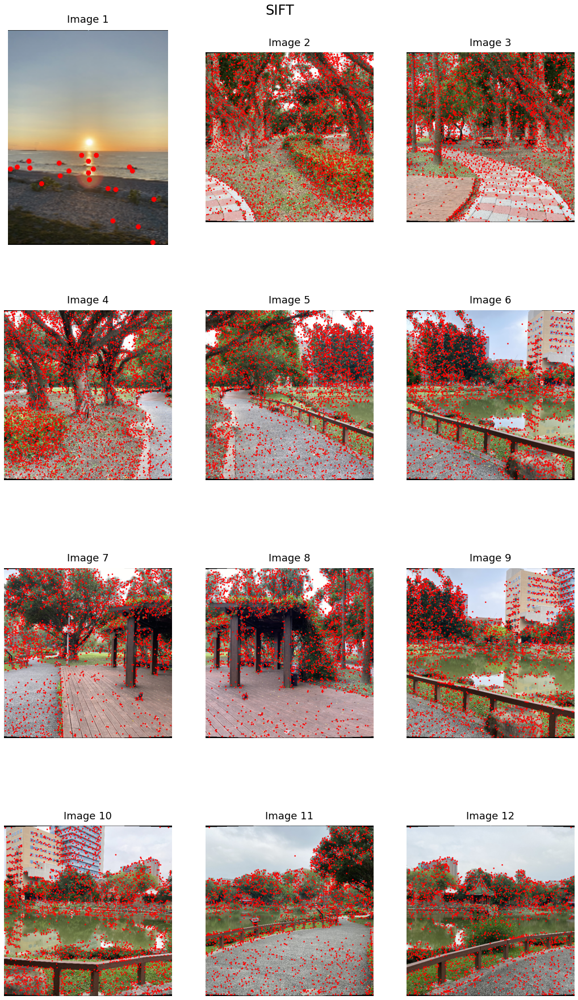

In [10]:
fig , axes = plt.subplots(int(np.ceil(len(images) / 3)) , 3 , figsize = (18 , 32))
for i , (image , keypoints) in enumerate(zip(images , keypoints_list)):
    SIFT_image = image.copy()
    for keypoint in keypoints:
        cv2.circle(SIFT_image , (int(keypoint.x) , int(keypoint.y)) , 1 , (0 , 0 , 255) , 2)
    ax = axes[i // 3 , i % 3]
    ax.set_title(f'Image {i + 1}' , fontsize = 18 , y = 1.02)
    ax.imshow(cv2.cvtColor(SIFT_image , cv2.COLOR_BGR2RGB))
    ax.set_axis_off()
plt.suptitle('SIFT' , fontsize = 24 , y = 0.9)
plt.show()

### Keypoint Matching

Reference: https://docs.opencv.org/3.4/d5/d6f/tutorial_feature_flann_matcher.html

In [11]:
def keypoint_matching(images , descriptors_list):
    all_matches_list = []
    match_count = np.zeros((len(images) , len(images)))
    for i in range(len(descriptors_list)):
        for j in range(len(descriptors_list)):
            all_matches = []
            if i != j:
                matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
                match_result = matcher.knnMatch(descriptors_list[i].astype(np.float32) , descriptors_list[j].astype(np.float32) , k = 2)
                for match_1 , match_2 in match_result:
                    if match_1.distance < 0.7 * match_2.distance:
                        all_matches.append(match_1)
                        match_count[i][j] += 1
            all_matches_list.append(all_matches)
    return all_matches_list , match_count

In [12]:
all_matches_list , match_count = keypoint_matching(images , descriptors_list)

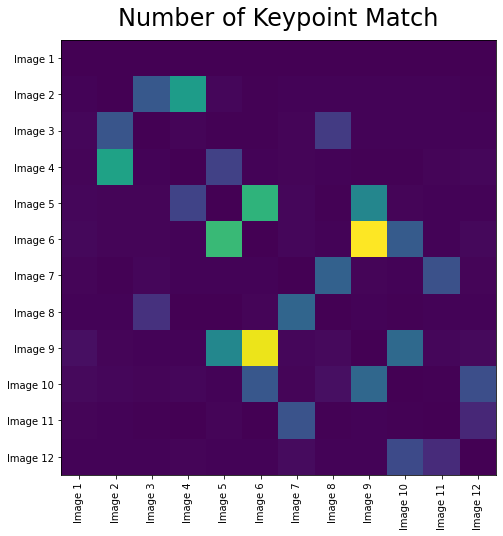

In [13]:
plt.figure(figsize = (8 , 8))
plt.title('Number of Keypoint Match' , fontsize = 24 , y = 1.02)
plt.imshow(match_count)
plt.xticks(np.arange(len(images)) , [f'Image {i + 1}' for i in range(len(images))] , rotation = 90)
plt.yticks(np.arange(len(images)) , [f'Image {i + 1}' for i in range(len(images))] , rotation = 0)
plt.show()

### Image Matching & Image Blending

In [14]:
def RANSAC(keypoints_1 , keypoints_2 , all_matches , iteration = 1000 , threshold = 5):
    max_number_of_inlier , best_offset_x , best_offset_y = -np.inf , None , None
    for _ in range(iteration):
        selected_match = random.choice(all_matches)
        offset_x = keypoints_1[selected_match.queryIdx].x - keypoints_2[selected_match.trainIdx].x
        offset_y = keypoints_1[selected_match.queryIdx].y - keypoints_2[selected_match.trainIdx].y
        number_of_inlier = 0
        for match in all_matches:
            error = (keypoints_1[match.queryIdx].x - (keypoints_2[match.trainIdx].x + offset_x))**2 + (keypoints_1[match.queryIdx].y - (keypoints_2[match.trainIdx].y + offset_y))**2
            if error < threshold:
                number_of_inlier += 1
        if number_of_inlier > max_number_of_inlier:
            max_number_of_inlier = number_of_inlier
            best_offset_x = offset_x
            best_offset_y = offset_y
    
    good_matches = []
    for match in all_matches:
        error = (keypoints_1[match.queryIdx].x - (keypoints_2[match.trainIdx].x + best_offset_x))**2 + (keypoints_1[match.queryIdx].y - (keypoints_2[match.trainIdx].y + best_offset_y))**2
        if error < threshold:
            good_matches.append(match)
            
    return int(np.round(best_offset_x)) , int(np.round(best_offset_y)) , good_matches

def image_match_verification(all_matches , good_matches):
    return len(all_matches) > 5.9 + 0.22 * len(good_matches)

def linear_blending(image_1 , image_2 , mask_1 , mask_2 , offset_x , offset_y):
    result_width = image_2.shape[1] + abs(offset_x) if offset_x > 0 else image_1.shape[1] + abs(offset_x)
    result_height = image_2.shape[0] + abs(offset_y) if offset_y > 0 else image_1.shape[0] + abs(offset_y)

    translation_matrix = np.array([[1 , 0 , max(0 , -offset_x)] , [0 , 1 , max(0 , -offset_y)]]).astype(np.float32)
    translated_image_1 = cv2.warpAffine(image_1 , translation_matrix , (result_width , result_height))
    translated_mask_1 = cv2.warpAffine(mask_1 , translation_matrix , (result_width , result_height))

    translation_matrix = np.array([[1 , 0 , max(0 , offset_x)] , [0 , 1 , max(0 , offset_y)]]).astype(np.float32)
    translated_image_2 = cv2.warpAffine(image_2 , translation_matrix , (result_width , result_height))
    translated_mask_2 = cv2.warpAffine(mask_2 , translation_matrix , (result_width , result_height))

    if offset_x > 0:
        weight = np.concatenate([np.ones(abs(offset_x)) , np.linspace(1 , 0 , image_1.shape[1] - abs(offset_x)) , np.zeros(abs(offset_x) + image_2.shape[1] - image_1.shape[1])] , axis = 0)
    else:
        weight = np.concatenate([np.zeros(abs(offset_x)) , np.linspace(0 , 1 , image_2.shape[1] - abs(offset_x)) , np.ones(abs(offset_x) + image_1.shape[1] - image_2.shape[1])] , axis = 0)
    weight = np.repeat(np.expand_dims(np.repeat(np.expand_dims(weight , axis = 0) , result_height , axis = 0) , axis = -1) , 3 , axis = 2)

    result = weight * translated_image_1 + (1 - weight) * translated_image_2

    result[np.logical_and(translated_mask_1 , np.logical_not(translated_mask_2))] = translated_image_1[np.logical_and(translated_mask_1 , np.logical_not(translated_mask_2))]
    result[np.logical_and(translated_mask_2 , np.logical_not(translated_mask_1))] = translated_image_2[np.logical_and(translated_mask_2 , np.logical_not(translated_mask_1))]
    result_mask = np.logical_or(translated_mask_1 , translated_mask_2)

    return result.astype(np.uint8) , result_mask.astype(np.uint8)

def stitch_images(images , masks , keypoints_list , all_matches_list , match_count , potential_image_match = 6 , start_index = 0):
    next_image_index = [start_index]
    used = np.zeros(len(images))
    used[start_index] = 1
    total_offset_x = np.zeros(len(images)).astype(int)
    total_offset_y = np.zeros(len(images)).astype(int)
    result = images[start_index].copy()
    result_mask = masks[start_index].copy()
    while next_image_index:
        i = next_image_index[0]
        next_image_index.pop(0)
        for j in np.flip(np.argsort(match_count[i]))[ : potential_image_match]:
            if used[j]:
                continue
            all_matches = all_matches_list[i * len(images) + j]
            offset_x , offset_y , good_matches = RANSAC(keypoints_list[i] , keypoints_list[j] , all_matches)
            if image_match_verification(all_matches , good_matches):
                offset_x += total_offset_x[i]
                offset_y += total_offset_y[i]
                result , result_mask = linear_blending(result , images[j] , result_mask , masks[j] , offset_x , offset_y)
                for k in range(len(images)):
                    if used[k]:
                        total_offset_x[k] += max(0 , -offset_x)
                        total_offset_y[k] += max(0 , -offset_y)
                total_offset_x[j] = max(0 , offset_x)
                total_offset_y[j] = max(0 , offset_y)
                used[j] = 1
                next_image_index.append(j)

                plt.figure(figsize = (18 , 6))
                plt.title(f'Stitch Image {j + 1} with Image {i + 1}' , fontsize = 24 , y = 1.02)
                plt.imshow(cv2.cvtColor(result , cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.show()
    return result

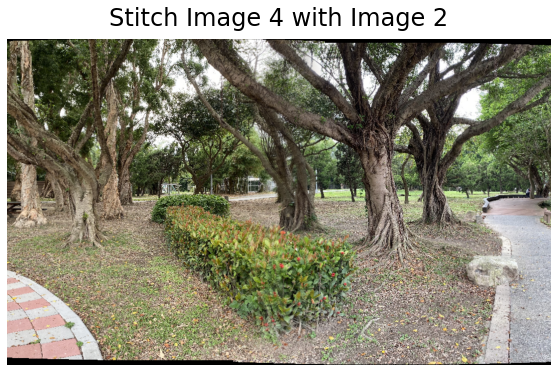

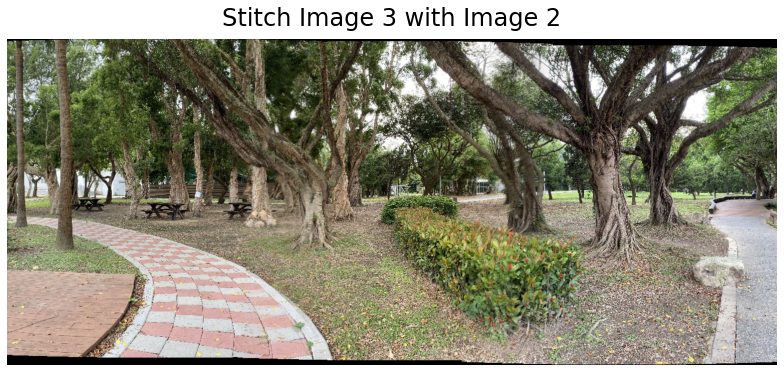

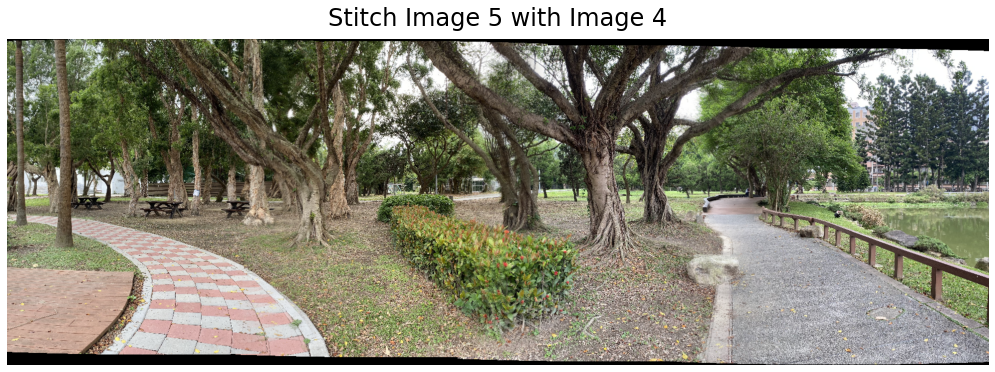

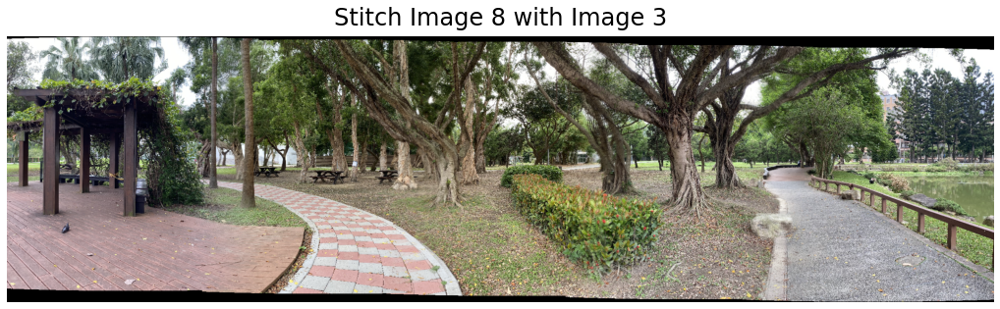

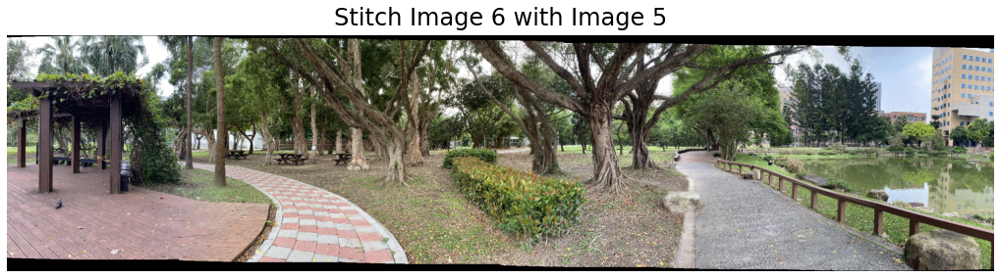

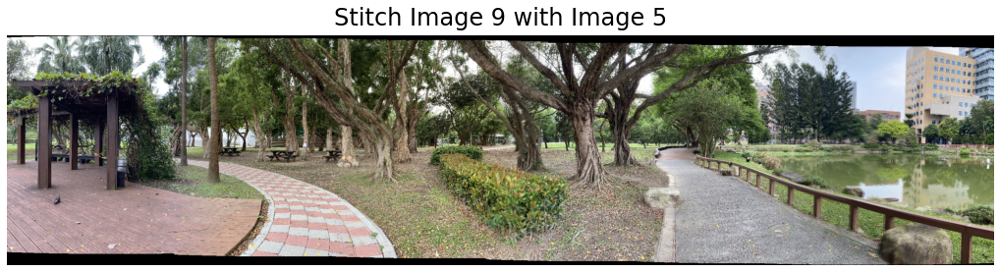

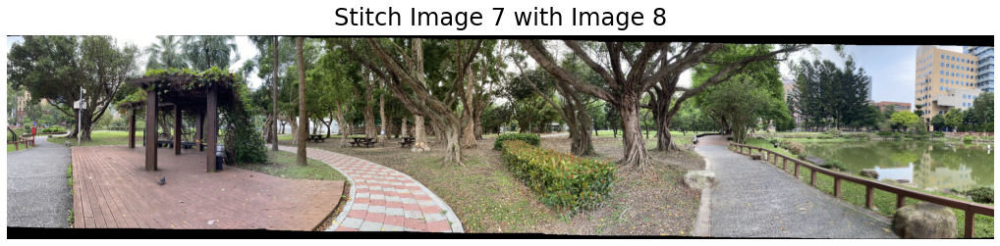

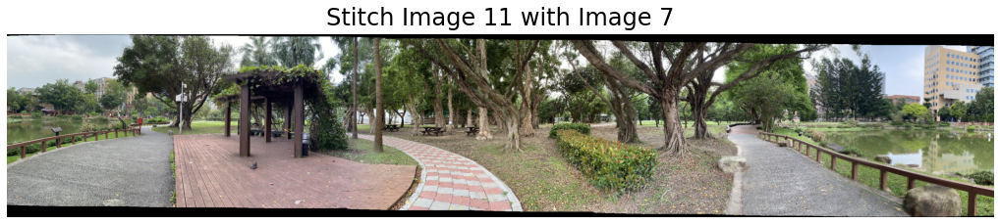

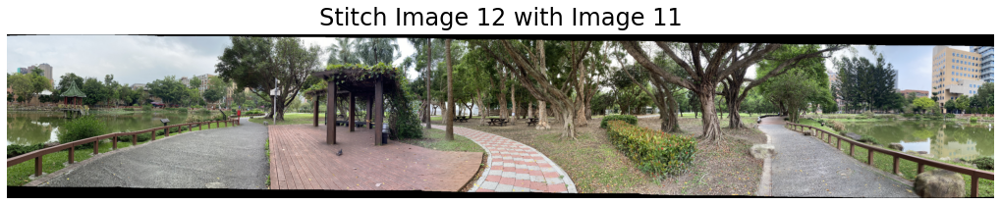

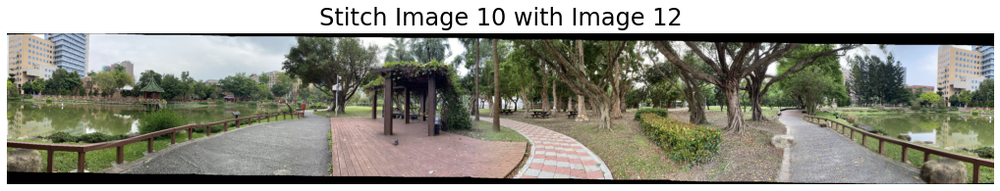

In [15]:
result = stitch_images(images , masks , keypoints_list , all_matches_list , match_count , potential_image_match = 2 , start_index = 1)

### End-to-end Alignment and Crop

In [16]:
def global_alignment(image , border = 5):
    height , width , _ = image.shape
    x1 , y1 = 0 , np.where(np.sum(image , axis = 2)[ : , 0] != 0)[0][0]
    x2 , y2 = 0 , np.where(np.sum(image , axis = 2)[ : , 0] != 0)[0][-1]
    x3 , y3 = width - 1 , np.where(np.sum(image , axis = 2)[ : , -1] != 0)[0][-1]
    x4 , y4 = width - 1 , np.where(np.sum(image , axis = 2)[ : , -1] != 0)[0][0]
    new_height = min(abs(y1 - y2) , abs(y3 - y4))
    new_width = min(abs(x1 - x4) , abs(x2 - x3))
    source_points = np.array([[x1 , y1] , [x2 , y2] , [x3 , y3] , [x4 , y4]]).astype(np.float32)
    destination_points = np.array([[0 , 0] , [0 , new_height - 1] , [new_width - 1 , new_height - 1] , [new_width - 1 , 0]]).astype(np.float32)
    transform_matrix = cv2.getPerspectiveTransform(source_points , destination_points)
    return cv2.warpPerspective(image , transform_matrix , (new_width , new_height))[border : -border , border : -border , : ]

In [17]:
if args.global_alignment:
    result = global_alignment(result)

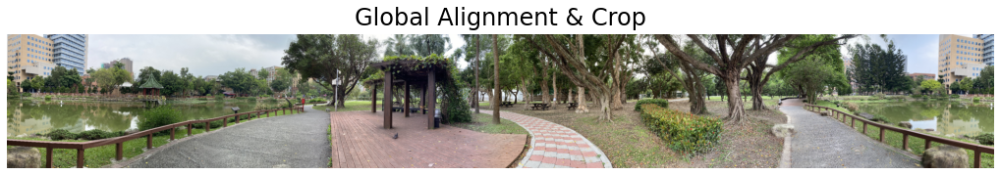

In [18]:
plt.figure(figsize = (18 , 6))
plt.title('Global Alignment & Crop' , fontsize = 24 , y = 1.02)
plt.imshow(cv2.cvtColor(result , cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [19]:
cv2.imwrite(args.output_image , result)

True